In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
data_depression = pd.read_csv("/content/drive/MyDrive/text_mining/datasets/depression_cleaned_balanced.csv")

data_depression.head()

,text,label
0,like anyone else love whatches mean dont know ...,0.0
1,straight boy want boy cuddle give hugs super c...,0.0
2,anyone experience bupropionwellbutrinzybanvoxr...,1.0
3,ways make good money guys say mow lawns mom sa...,0.0
4,dont know future life confusing glory days gon...,0.0


In [ ]:
print(data_depression.shape)
print(data_depression['label'].value_counts())

(851170, 2)
label
0.0    425585
1.0    425585
Name: count, dtype: int64


<ipython-input-26-ebcad1c4641f>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data_depression, x='label', palette='Set1')


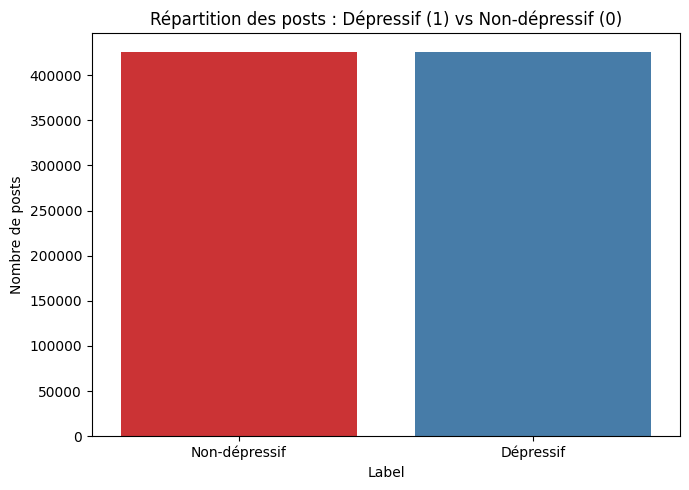

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(7, 5))
sns.countplot(data=data_depression, x='label', palette='Set1')
plt.title("Répartition des posts : Dépressif (1) vs Non-dépressif (0)")
plt.xlabel("Label")
plt.ylabel("Nombre de posts")
plt.xticks(ticks=[0,1], labels=["Non-dépressif", "Dépressif"])
plt.tight_layout()
plt.show()


<ipython-input-27-6c4a893c17c9>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_depression, x='label', y='text_length', palette='Set2')


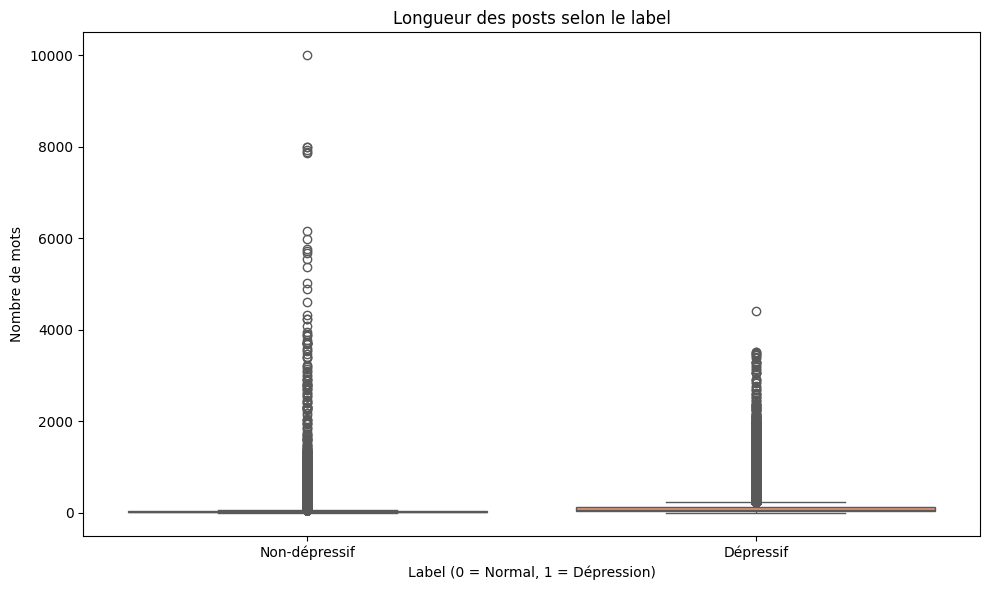

In [ ]:
data_depression['text_length'] = data_depression['text'].apply(lambda x: len(str(x).split()))

plt.figure(figsize=(10, 6))
sns.boxplot(data=data_depression, x='label', y='text_length', palette='Set2')
plt.title("Longueur des posts selon le label")
plt.xlabel("Label (0 = Normal, 1 = Dépression)")
plt.ylabel("Nombre de mots")
plt.xticks(ticks=[0,1], labels=["Non-dépressif", "Dépressif"])
plt.tight_layout()
plt.show()


<ipython-input-8-56a6c36d3ec1>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=10000, random_state=42))


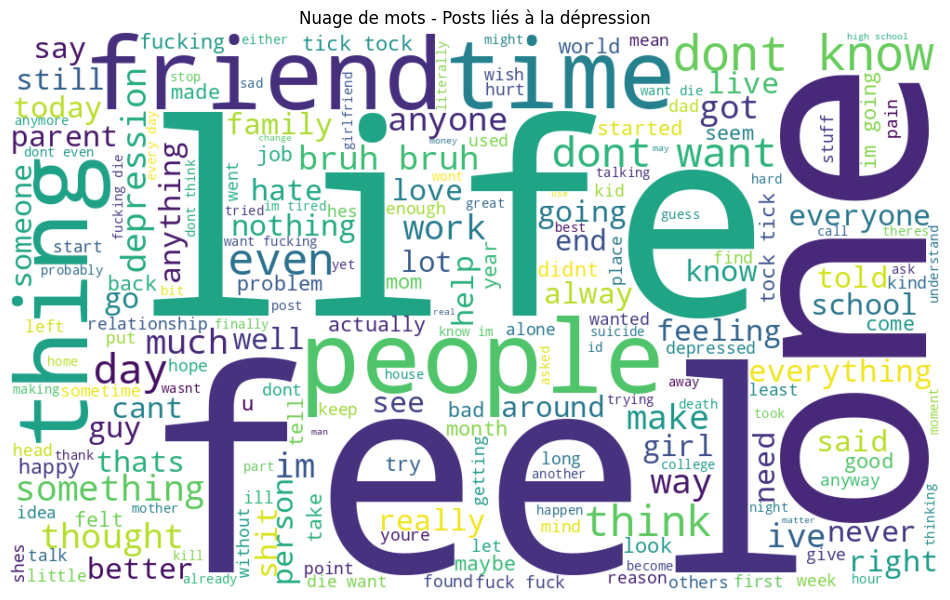

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
subset_data = (
    data_depression.groupby('label', group_keys=False)
    .apply(lambda x: x.sample(n=10000, random_state=42))
    .reset_index(drop=True)
)
from wordcloud import WordCloud

# Texte combiné
all_words = ' '.join(subset_data['text'].astype(str))

# Génération
wordcloud = WordCloud(width=1000, height=600, background_color='white').generate(all_words)

# Affichage
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Nuage de mots - Posts liés à la dépression")
plt.show()

<ipython-input-10-a168a7d12a31>:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=10000, random_state=42))


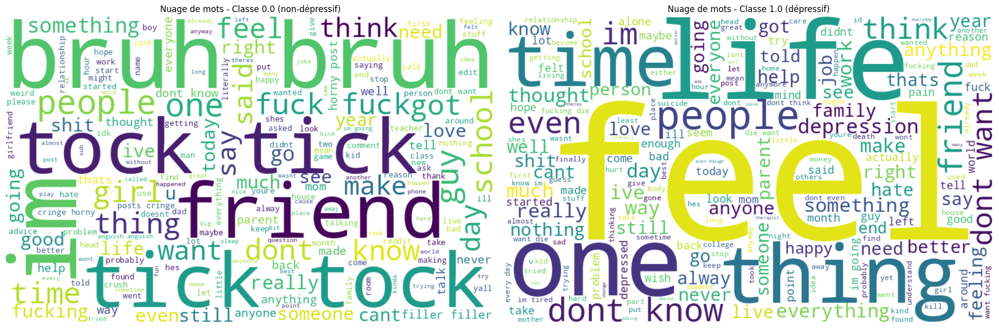

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Échantillonner 10 000 exemples par classe
subset_data = (
    data_depression.groupby('label', group_keys=False)
    .apply(lambda x: x.sample(n=10000, random_state=42))
    .reset_index(drop=True)
)

# Création des textes combinés pour chaque classe
text_0 = ' '.join(subset_data[subset_data['label'] == 0.0]['text'].astype(str))
text_1 = ' '.join(subset_data[subset_data['label'] == 1.0]['text'].astype(str))

# Génération des nuages de mots
wordcloud_0 = WordCloud(width=800, height=500, background_color='white').generate(text_0)
wordcloud_1 = WordCloud(width=800, height=500, background_color='white').generate(text_1)

# Affichage côte à côte
plt.figure(figsize=(20, 10))

# Nuage pour label 0.0
plt.subplot(1, 2, 1)
plt.imshow(wordcloud_0, interpolation='bilinear')
plt.axis("off")
plt.title("Nuage de mots - Classe 0.0 (non-dépressif)")

# Nuage pour label 1.0
plt.subplot(1, 2, 2)
plt.imshow(wordcloud_1, interpolation='bilinear')
plt.axis("off")
plt.title("Nuage de mots - Classe 1.0 (dépressif)")

plt.tight_layout()
plt.show()


Anxiety, BPD, bipolar, depression, schizophrenia

In [ ]:
data_reddit = pd.read_csv("/content/drive/MyDrive/text_mining/combined/reddit_processed_balanced.csv")

data_reddit.head()

,text,label
0,"Anyone else I personally have always, even as ...",Anxiety
1,Anxiety that I might be having a pulmonary emb...,Anxiety
2,Why are my feet sweating but are cold ?!!,Anxiety
3,Not able to eat outside Whenever I go out with...,Anxiety
4,How can I learn to live in the moment? It's cr...,Anxiety


In [ ]:
print(data_reddit.shape)
print(data_reddit['label'].value_counts())

(50000, 2)
label
Anxiety          10000
BPD              10000
bipolar          10000
depression       10000
schizophrenia    10000
Name: count, dtype: int64


<ipython-input-14-1a60fcb2c288>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data_reddit, x='label', order=data_reddit['label'].value_counts().index, palette='Set2')


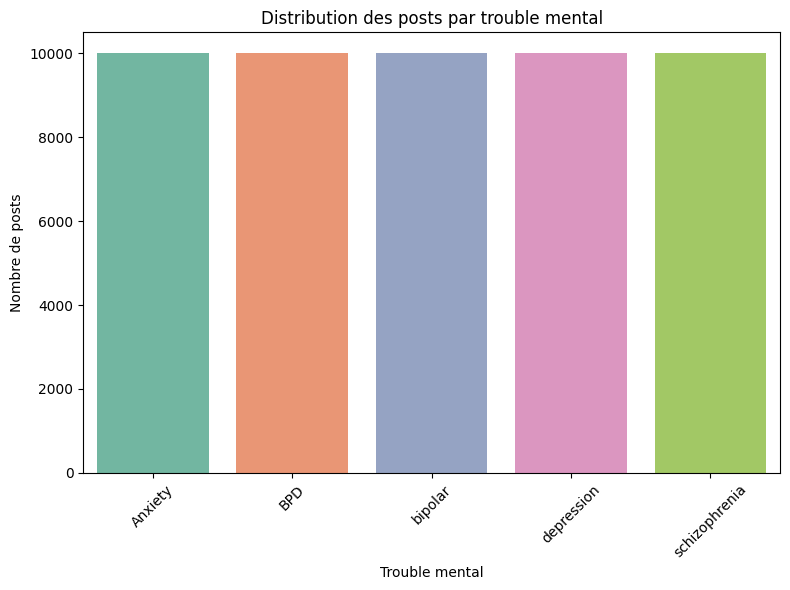

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Affichage de la répartition des classes
plt.figure(figsize=(8, 6))
sns.countplot(data=data_reddit, x='label', order=data_reddit['label'].value_counts().index, palette='Set2')
plt.title("Distribution des posts par trouble mental")
plt.xlabel("Trouble mental")
plt.ylabel("Nombre de posts")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


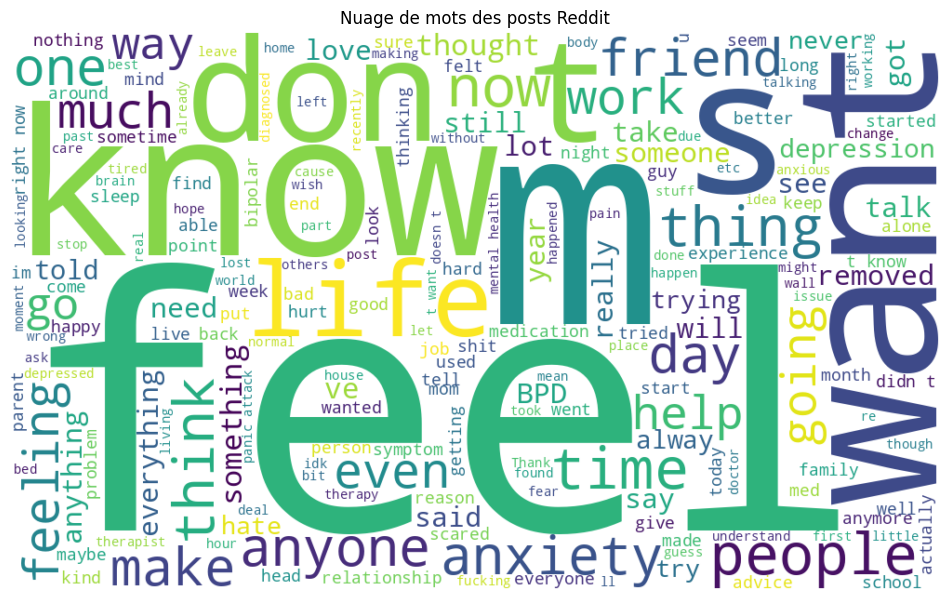

In [ ]:
from wordcloud import WordCloud

# Concaténer tous les textes
all_text = ' '.join(data_reddit['text'])

# Génération du nuage de mots
wordcloud = WordCloud(width=1000, height=600, background_color='white').generate(all_text)

# Affichage
plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Nuage de mots des posts Reddit")
plt.show()


<ipython-input-15-d4bb714436b4>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_reddit, x='label', y='text_length', palette='Set3')


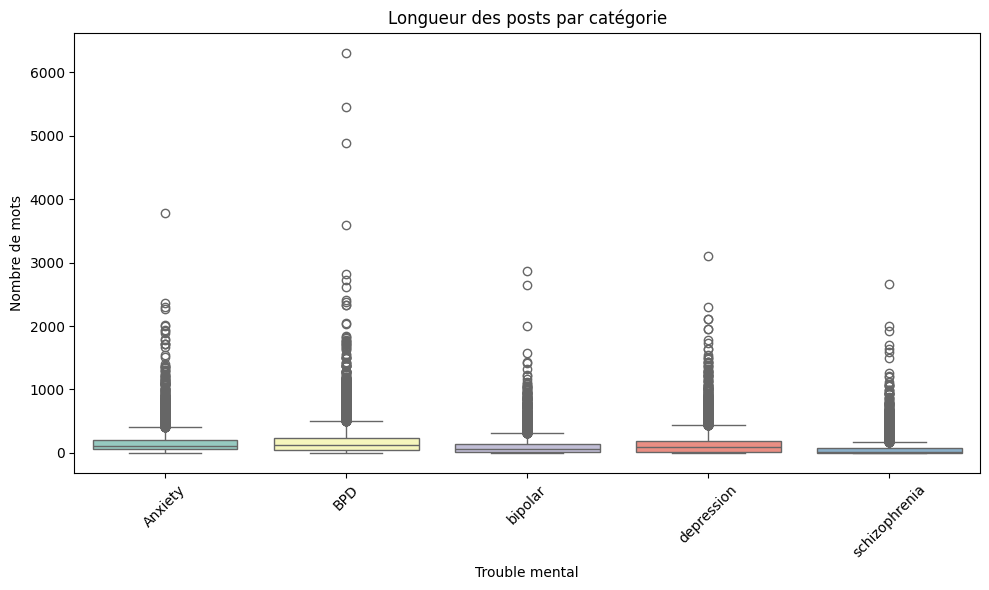

In [ ]:
# Création d'une nouvelle colonne "text_length"
data_reddit['text_length'] = data_reddit['text'].apply(lambda x: len(str(x).split()))

# Boîte à moustaches (boxplot) pour visualiser les longueurs
plt.figure(figsize=(10, 6))
sns.boxplot(data=data_reddit, x='label', y='text_length', palette='Set3')
plt.title("Longueur des posts par catégorie")
plt.xlabel("Trouble mental")
plt.ylabel("Nombre de mots")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


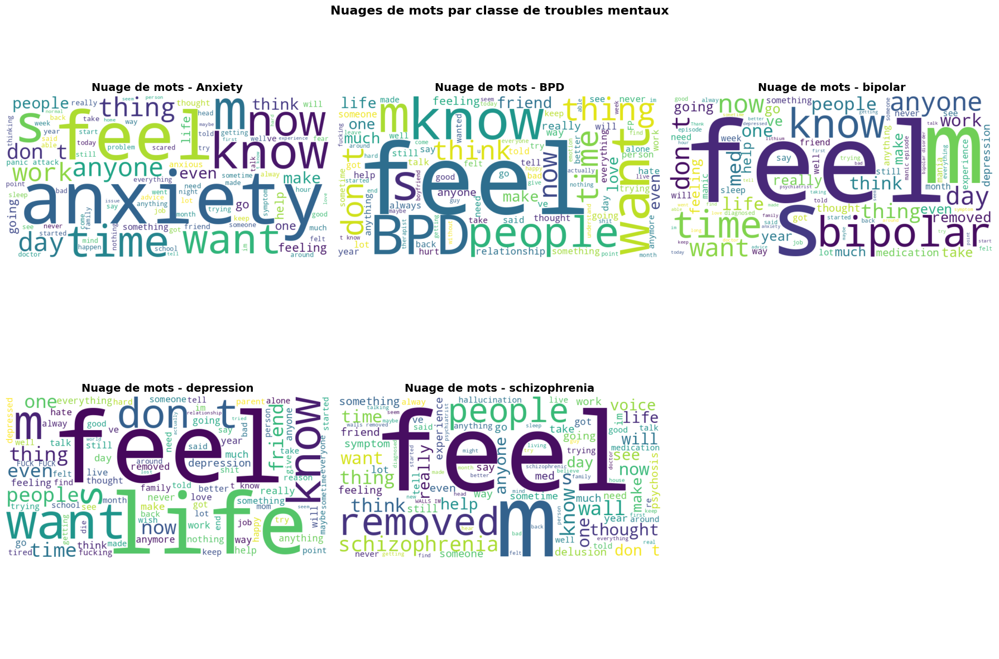

Affichage individuel de chaque classe:


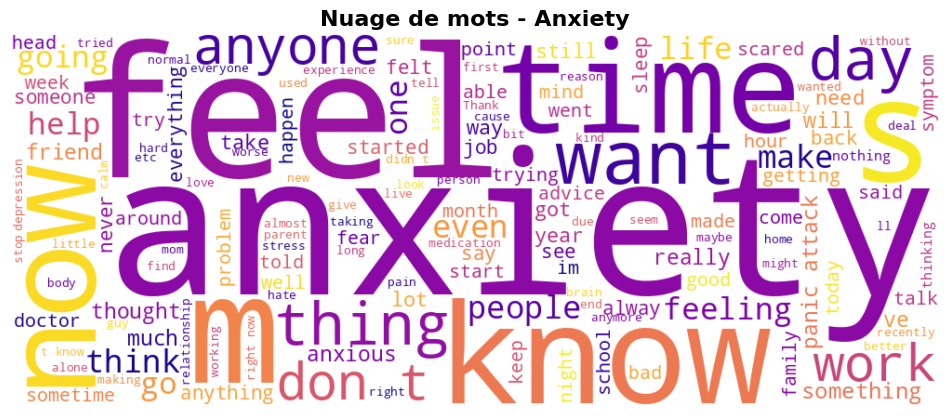

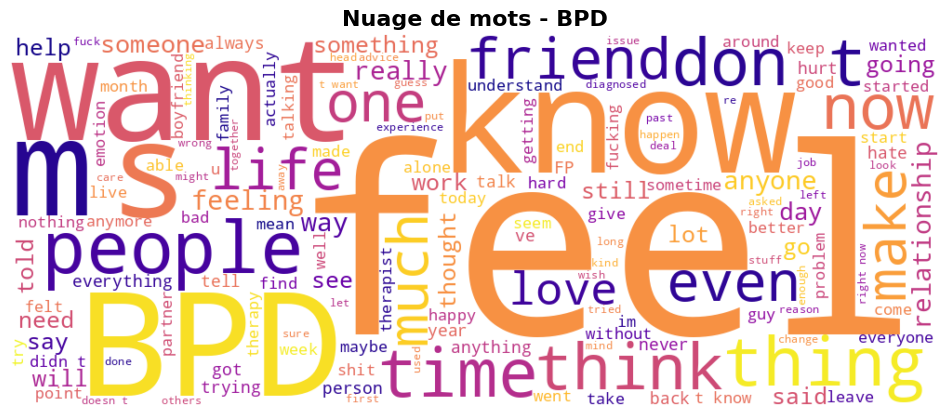

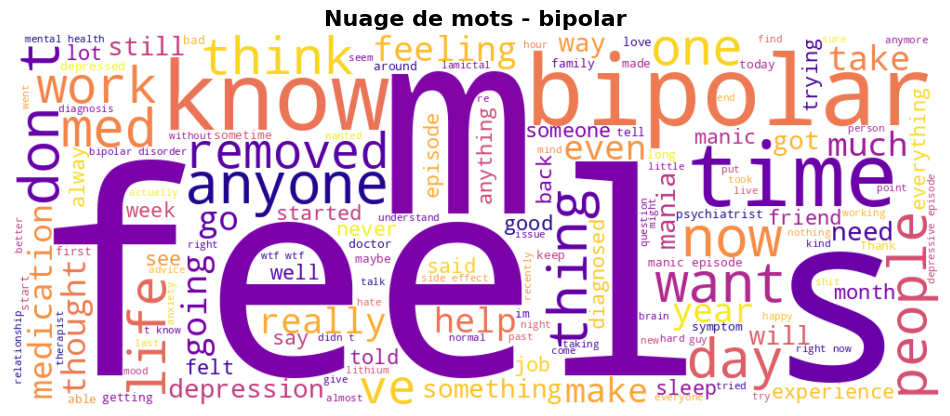

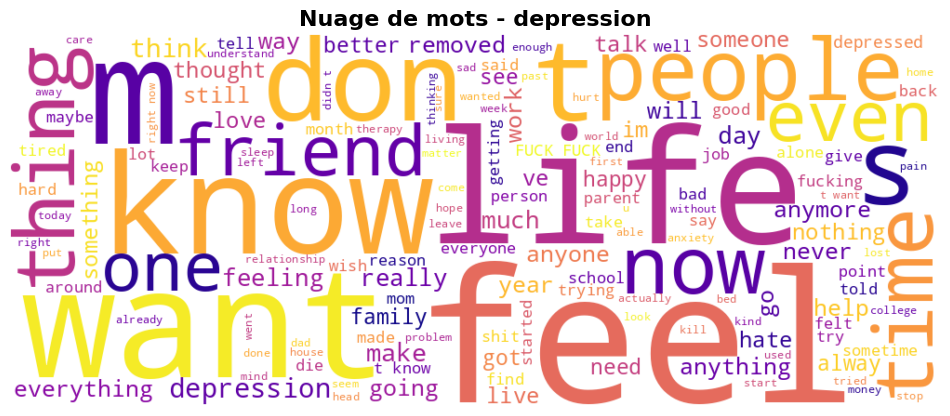

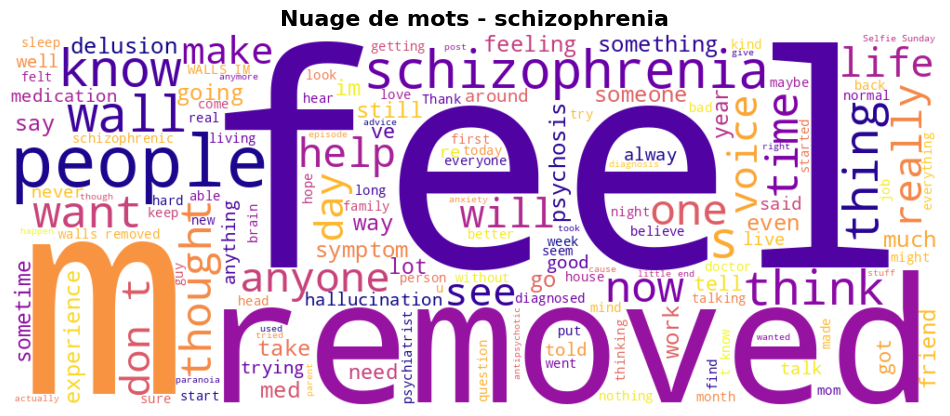

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Obtenir les classes uniques
classes = data_reddit['label'].unique()

# Créer une figure avec des sous-graphiques
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()  # Aplatir pour un accès plus facile

# Générer un nuage de mots pour chaque classe
for i, classe in enumerate(classes):
    # Filtrer les données pour la classe actuelle
    texts_classe = data_reddit[data_reddit['label'] == classe]['text']

    # Concaténer tous les textes de cette classe
    all_text_classe = ' '.join(texts_classe)

    # Générer le nuage de mots pour cette classe
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        max_words=100,
        colormap='viridis'
    ).generate(all_text_classe)

    # Afficher dans le sous-graphique correspondant
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(f'Nuage de mots - {classe}', fontsize=14, fontweight='bold')

# Masquer le dernier sous-graphique s'il n'est pas utilisé (5 classes, 6 emplacements)
if len(classes) < len(axes):
    axes[-1].axis('off')

plt.tight_layout()
plt.suptitle('Nuages de mots par classe de troubles mentaux', fontsize=16, fontweight='bold', y=0.98)
plt.show()

# Alternative: Afficher chaque nuage individuellement
print("Affichage individuel de chaque classe:")
for classe in classes:
    # Filtrer les données pour la classe actuelle
    texts_classe = data_reddit[data_reddit['label'] == classe]['text']

    # Concaténer tous les textes de cette classe
    all_text_classe = ' '.join(texts_classe)

    # Générer le nuage de mots pour cette classe
    wordcloud = WordCloud(
        width=1000,
        height=400,
        background_color='white',
        max_words=150,
        colormap='plasma'
    ).generate(all_text_classe)

    # Afficher individuellement
    plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Nuage de mots - {classe}', fontsize=16, fontweight='bold')
    plt.show()

In [ ]:
data_suicide = pd.read_csv("/content/drive/MyDrive/text_mining/combined/combined_balanced_cleaned.csv")

data_suicide.head()

,statement,status,text
0,"I try so hard to be happy. For me, for my fami...",Depression,try hard happy family friends cannot jealous f...
1,If you do not love someone or cannot promise t...,Depression,love someone cannot promise love die get marri...
2,I have suffered from depression and anxiety fo...,Depression,suffered depression anxiety many years resulte...
3,i have been on prozac since maybe september la...,Depression,prozac since maybe september last year prozac ...
4,I ask myself daily will my extra efforts towar...,Depression,ask daily extra efforts towards better life im...


In [ ]:
print(data_suicide.shape)
print(data_suicide['status'].value_counts())

(31956, 3)
status
Depression    10652
Normal        10652
Suicidal      10652
Name: count, dtype: int64


<ipython-input-13-bd3bf148d559>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data_suicide, x='status', order=data_suicide['status'].value_counts().index, palette='pastel')


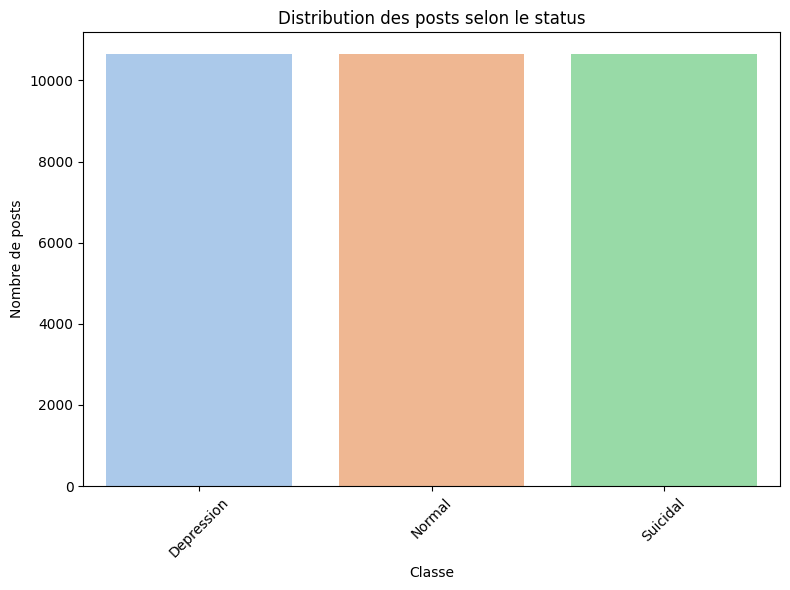

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.countplot(data=data_suicide, x='status', order=data_suicide['status'].value_counts().index, palette='pastel')
plt.title("Distribution des posts selon le status")
plt.xlabel("Classe")
plt.ylabel("Nombre de posts")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<ipython-input-14-13d0073f53ea>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_suicide, x='status', y='text_length', palette='coolwarm')


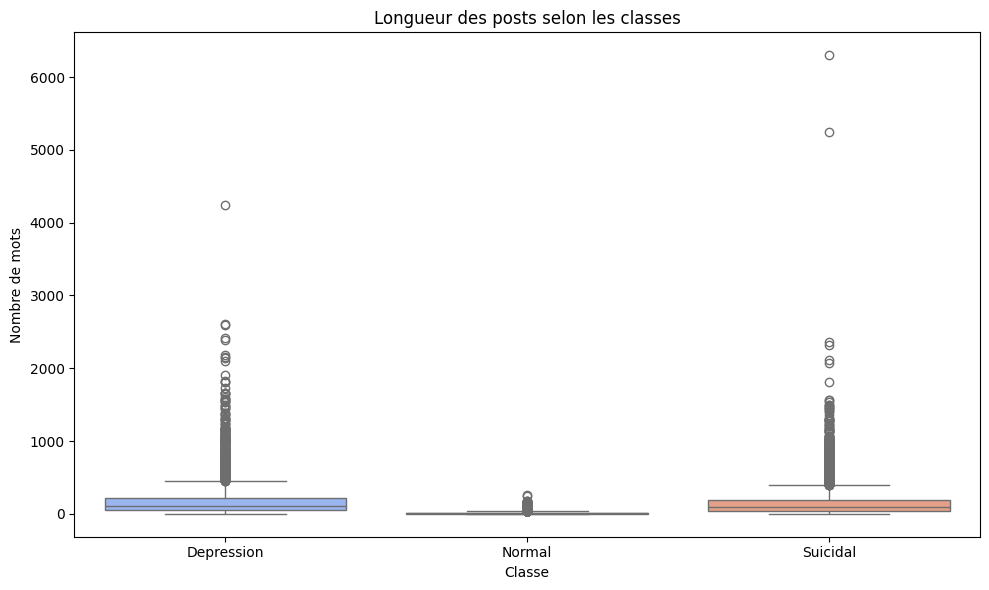

In [ ]:
# Longueur des textes (nombre de mots dans "statement")
data_suicide['text_length'] = data_suicide['statement'].apply(lambda x: len(str(x).split()))

plt.figure(figsize=(10, 6))
sns.boxplot(data=data_suicide, x='status', y='text_length', palette='coolwarm')
plt.title("Longueur des posts selon les classes")
plt.xlabel("Classe")
plt.ylabel("Nombre de mots")
plt.tight_layout()
plt.show()


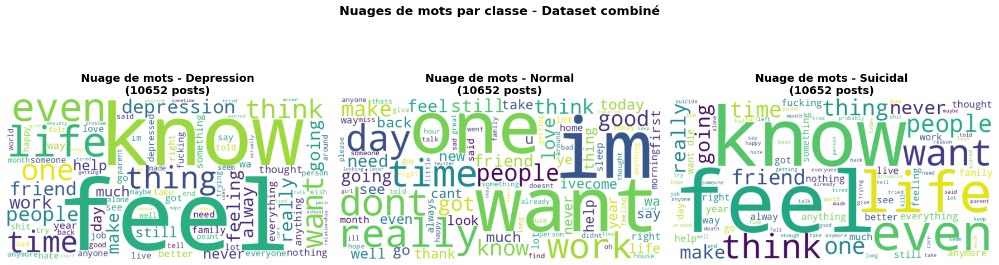

Affichage individuel de chaque classe:


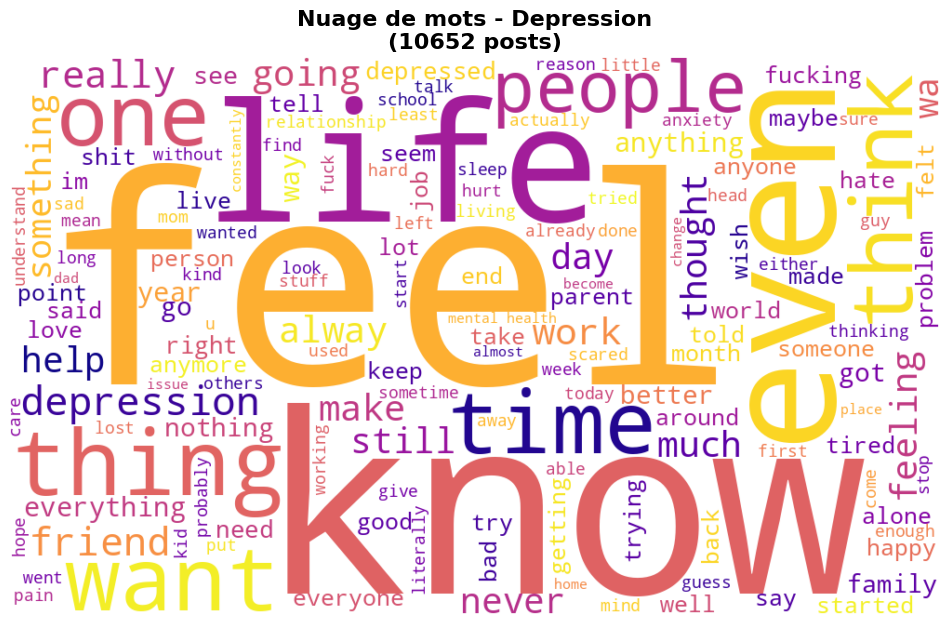

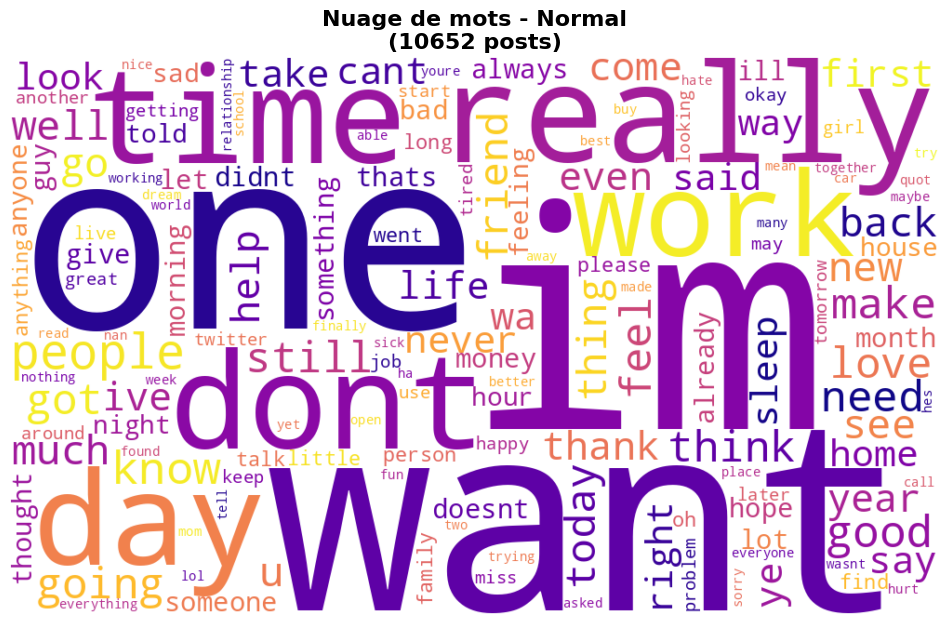

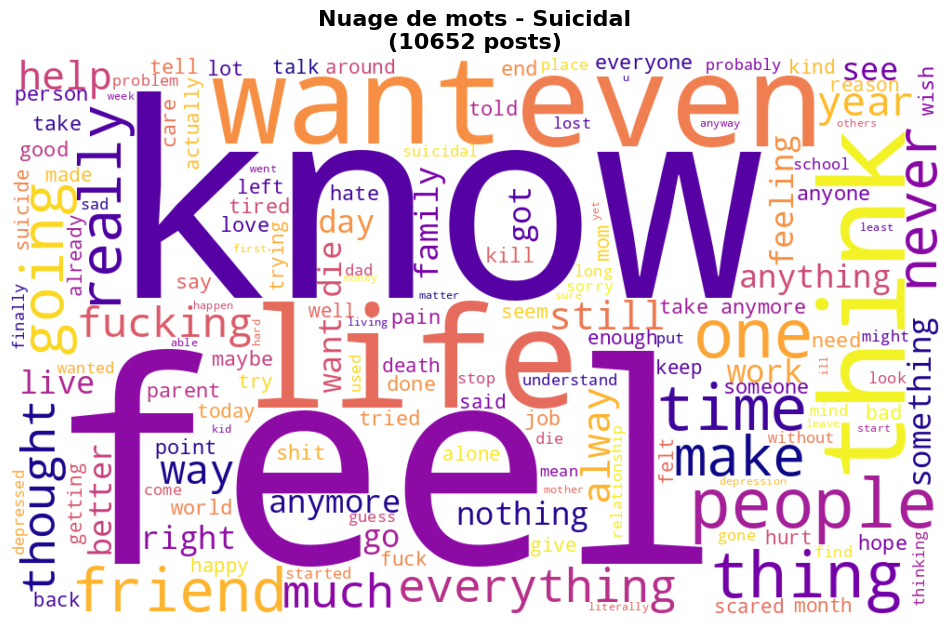


Statistiques par classe:
Depression: 10652 posts, 797309 mots au total, 74.9 mots/post en moyenne
Normal: 10652 posts, 94090 mots au total, 8.8 mots/post en moyenne
Suicidal: 10652 posts, 675605 mots au total, 63.4 mots/post en moyenne


In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Obtenir les classes uniques
classes = data_suicide['status'].unique()

# Créer une figure avec des sous-graphiques (1 ligne, 3 colonnes pour 3 classes)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Générer un nuage de mots pour chaque classe
for i, classe in enumerate(classes):
    # Filtrer les données pour la classe actuelle
    texts_classe = data_suicide[data_suicide['status'] == classe]['text']

    # Concaténer tous les textes de cette classe (conversion en string pour éviter les erreurs)
    all_text_classe = ' '.join(texts_classe.astype(str))

    # Générer le nuage de mots pour cette classe
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        max_words=100,
        colormap='viridis'
    ).generate(all_text_classe)

    # Afficher dans le sous-graphique correspondant
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(f'Nuage de mots - {classe}\n({len(texts_classe)} posts)',
                     fontsize=14, fontweight='bold')

plt.tight_layout()
plt.suptitle('Nuages de mots par classe - Dataset combiné', fontsize=16, fontweight='bold', y=1.02)
plt.show()

# Alternative: Afficher chaque nuage individuellement avec plus de détails
print("Affichage individuel de chaque classe:")
for classe in classes:
    # Filtrer les données pour la classe actuelle
    texts_classe = data_suicide[data_suicide['status'] == classe]['text']

    # Concaténer tous les textes de cette classe
    all_text_classe = ' '.join(texts_classe.astype(str))

    # Générer le nuage de mots pour cette classe
    wordcloud = WordCloud(
        width=1000,
        height=600,
        background_color='white',
        max_words=150,
        colormap='plasma'
    ).generate(all_text_classe)

    # Afficher individuellement
    plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Nuage de mots - {classe}\n({len(texts_classe)} posts)',
             fontsize=16, fontweight='bold')
    plt.show()

# Afficher les statistiques de chaque classe
print("\nStatistiques par classe:")
for classe in classes:
    texts_classe = data_suicide[data_suicide['status'] == classe]['text']
    nb_posts = len(texts_classe)
    nb_mots_total = sum(len(str(text).split()) for text in texts_classe)
    moy_mots_par_post = nb_mots_total / nb_posts if nb_posts > 0 else 0

    print(f"{classe}: {nb_posts} posts, {nb_mots_total} mots au total, "
          f"{moy_mots_par_post:.1f} mots/post en moyenne")

In [ ]:
data_combined = pd.read_csv("/content/drive/MyDrive/text_mining/combined/combined_anxiety_cleaned.csv")

data_combined.head()

,statement,label,text
0,"I try so hard to be happy. For me, for my fami...",Depression,try hard happy family friends cannot jealous f...
1,If you do not love someone or cannot promise t...,Depression,love someone cannot promise love die get marri...
2,I have suffered from depression and anxiety fo...,Depression,suffered depression anxiety many years resulte...
3,i have been on prozac since maybe september la...,Depression,prozac since maybe september last year prozac ...
4,I ask myself daily will my extra efforts towar...,Depression,ask daily extra efforts towards better life im...


In [ ]:
print(data_combined.shape)
print(data_combined['label'].value_counts())

(23774, 3)
label
Depression    10652
Normal        10652
anxiety        2470
Name: count, dtype: int64


<ipython-input-20-e5f85c1b2234>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data_combined, x='label', order=data_combined['label'].value_counts().index, palette='pastel')


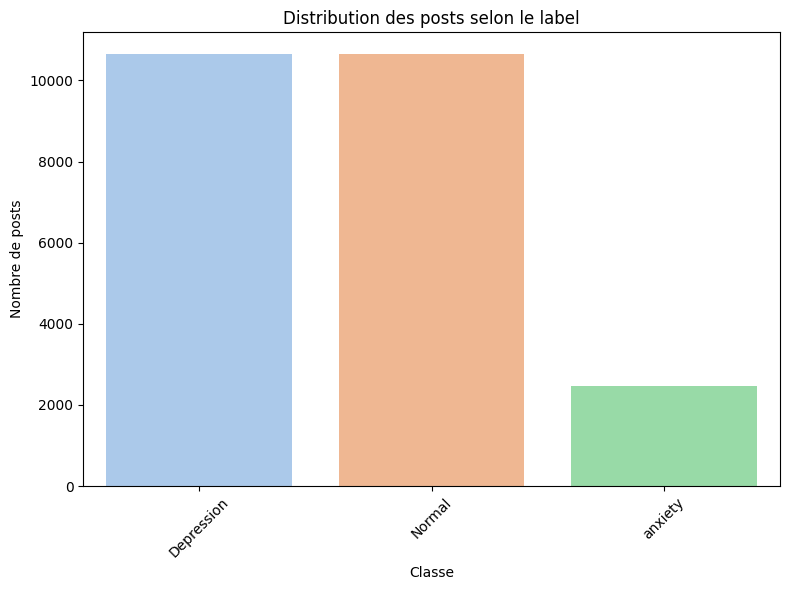

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.countplot(data=data_combined, x='label', order=data_combined['label'].value_counts().index, palette='pastel')
plt.title("Distribution des posts selon le label")
plt.xlabel("Classe")
plt.ylabel("Nombre de posts")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<ipython-input-21-9384eb6f2ee6>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data_combined, x='label', y='text_length', palette='coolwarm')


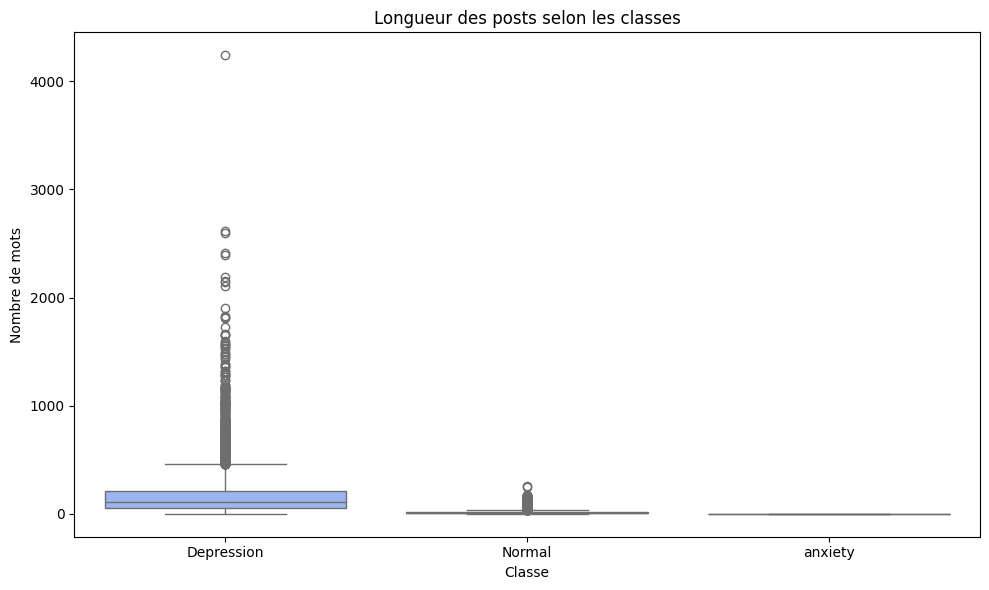

In [ ]:
# Longueur des textes (nombre de mots dans "statement")
data_combined['text_length'] = data_combined['statement'].apply(lambda x: len(str(x).split()))

plt.figure(figsize=(10, 6))
sns.boxplot(data=data_combined, x='label', y='text_length', palette='coolwarm')
plt.title("Longueur des posts selon les classes")
plt.xlabel("Classe")
plt.ylabel("Nombre de mots")
plt.tight_layout()
plt.show()


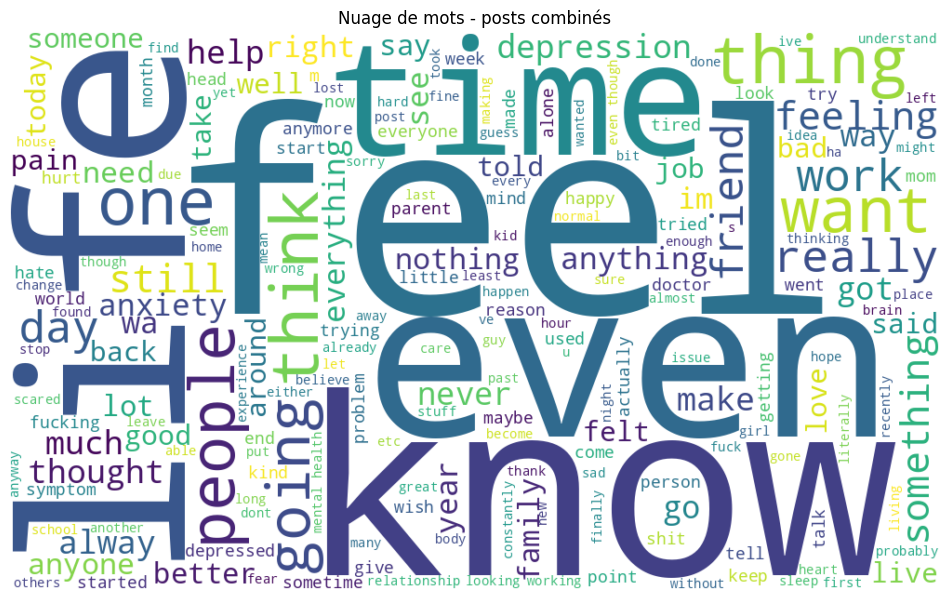

In [ ]:
from wordcloud import WordCloud

all_words = ' '.join(data_combined['text'].astype(str))

wordcloud = WordCloud(width=1000, height=600, background_color='white').generate(all_words)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Nuage de mots - posts combinés")
plt.show()


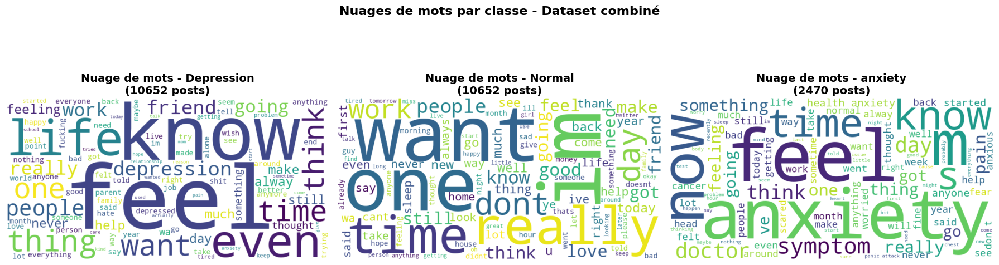

Affichage individuel de chaque classe:


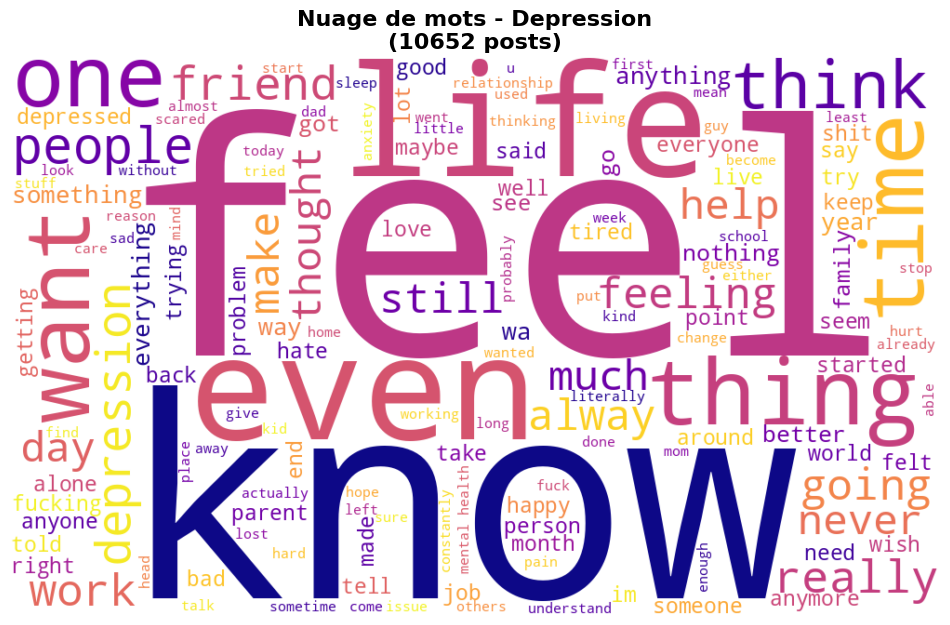

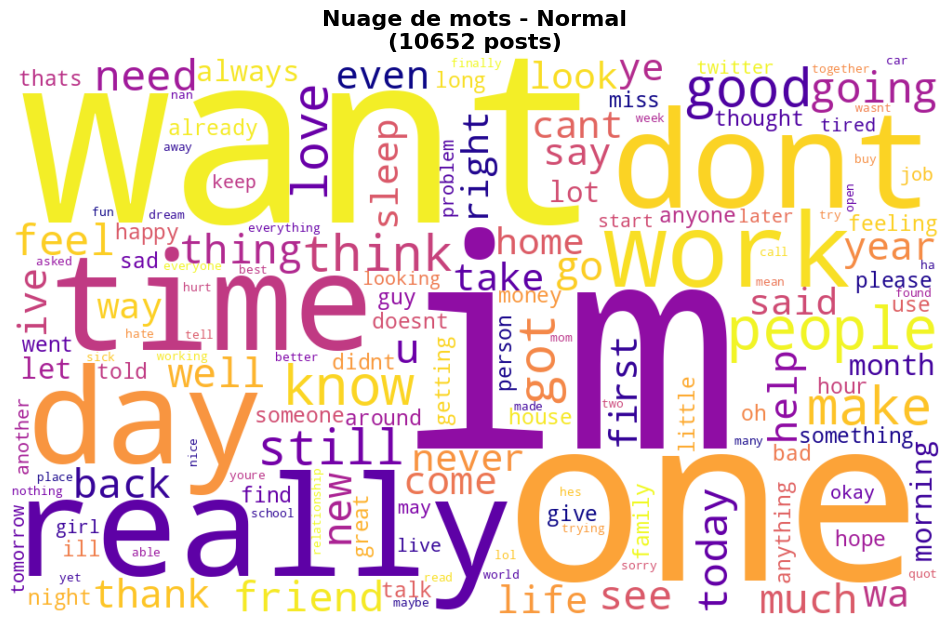

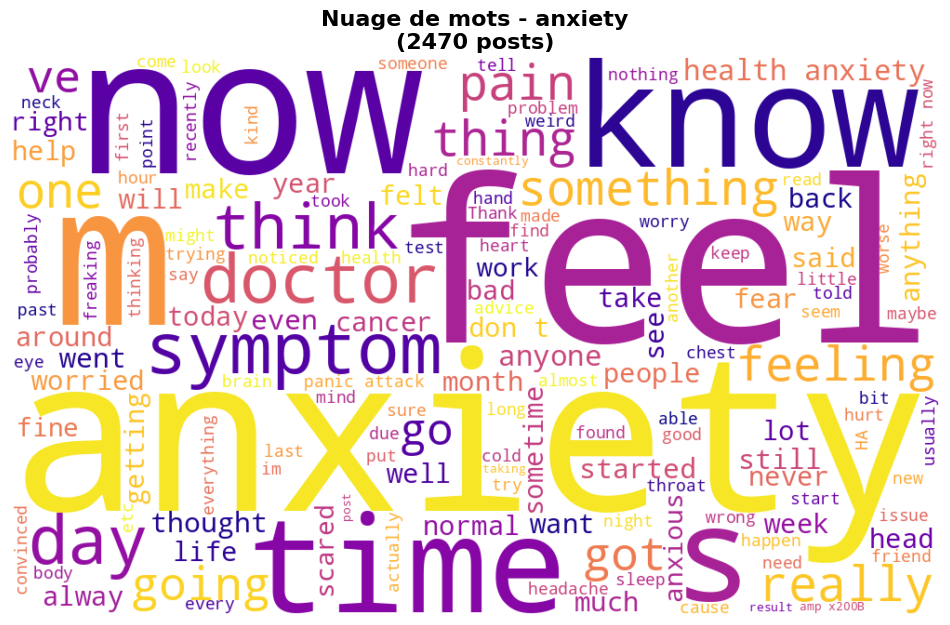


Statistiques par classe:
Depression: 10652 posts, 797309 mots au total, 74.9 mots/post en moyenne
Normal: 10652 posts, 94090 mots au total, 8.8 mots/post en moyenne
anxiety: 2470 posts, 397625 mots au total, 161.0 mots/post en moyenne


In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Obtenir les classes uniques
classes = data_combined['label'].unique()

# Créer une figure avec des sous-graphiques (1 ligne, 3 colonnes pour 3 classes)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Générer un nuage de mots pour chaque classe
for i, classe in enumerate(classes):
    # Filtrer les données pour la classe actuelle
    texts_classe = data_combined[data_combined['label'] == classe]['text']

    # Concaténer tous les textes de cette classe (conversion en string pour éviter les erreurs)
    all_text_classe = ' '.join(texts_classe.astype(str))

    # Générer le nuage de mots pour cette classe
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color='white',
        max_words=100,
        colormap='viridis'
    ).generate(all_text_classe)

    # Afficher dans le sous-graphique correspondant
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(f'Nuage de mots - {classe}\n({len(texts_classe)} posts)',
                     fontsize=14, fontweight='bold')

plt.tight_layout()
plt.suptitle('Nuages de mots par classe - Dataset combiné', fontsize=16, fontweight='bold', y=1.02)
plt.show()

# Alternative: Afficher chaque nuage individuellement avec plus de détails
print("Affichage individuel de chaque classe:")
for classe in classes:
    # Filtrer les données pour la classe actuelle
    texts_classe = data_combined[data_combined['label'] == classe]['text']

    # Concaténer tous les textes de cette classe
    all_text_classe = ' '.join(texts_classe.astype(str))

    # Générer le nuage de mots pour cette classe
    wordcloud = WordCloud(
        width=1000,
        height=600,
        background_color='white',
        max_words=150,
        colormap='plasma'
    ).generate(all_text_classe)

    # Afficher individuellement
    plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Nuage de mots - {classe}\n({len(texts_classe)} posts)',
             fontsize=16, fontweight='bold')
    plt.show()

# Afficher les statistiques de chaque classe
print("\nStatistiques par classe:")
for classe in classes:
    texts_classe = data_combined[data_combined['label'] == classe]['text']
    nb_posts = len(texts_classe)
    nb_mots_total = sum(len(str(text).split()) for text in texts_classe)
    moy_mots_par_post = nb_mots_total / nb_posts if nb_posts > 0 else 0

    print(f"{classe}: {nb_posts} posts, {nb_mots_total} mots au total, "
          f"{moy_mots_par_post:.1f} mots/post en moyenne")

In [ ]:
# Tableau résumant le nombre d'exemples par classe
label_summary = data_combined['label'].value_counts().reset_index()
label_summary.columns = ['Classe', 'Nombre de posts']
print(label_summary)


       Classe  Nombre de posts
0  Depression            10652
1      Normal            10652
2     anxiety             2470
